In [1]:
#Data Handling
import numpy as np
import pandas as pd
import re
from sklearn.preprocessing import minmax_scale
#Visualization
from matplotlib import pyplot as plt
%matplotlib inline
from IPython.display import display
import seaborn as sns
import plotly.offline as plotly
plotly.offline.init_notebook_mode()
from plotly.graph_objs import *
import plotly.figure_factory as FF
#Feature extraction
from sklearn.decomposition import PCA
from sklearn.manifold import TSNE
from scipy.cluster.hierarchy import linkage, dendrogram
from sklearn.cluster.bicluster import SpectralBiclustering, SpectralCoclustering
#Clustering
from sklearn.cluster import KMeans
from sklearn.cluster import AgglomerativeClustering
from sklearn.decomposition import NMF
#Misc
from scipy.signal import argrelextrema
from math import floor
from os import listdir

In [2]:
raw_metadata = pd.read_csv("data/metadata.csv")
raw_metadata["Experimental Group"] = [re.sub("\d+", "", x) for x in raw_metadata["Sample ID"]]
raw_data = pd.read_csv("data/gene_expression.csv")
raw_data.index = raw_data.iloc[:,0]
raw_data = raw_data.iloc[:,1:]
raw_data.columns = raw_metadata["Sample ID"]
raw_data = raw_data.T
count_data = raw_data.iloc[:, :-5]

# Sequencing Quality Analysis

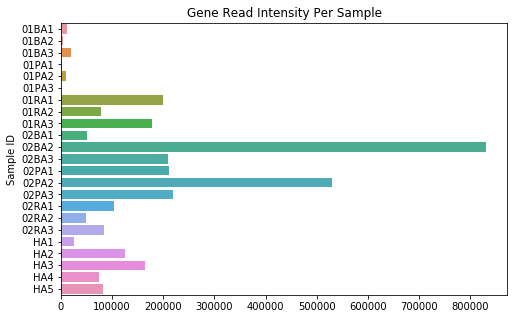

In [3]:
plt.figure(figsize=[8,5])
sns.barplot(y=count_data.index, x=count_data.sum(axis=1))
plt.title("Gene Read Intensity Per Sample")
plt.show()

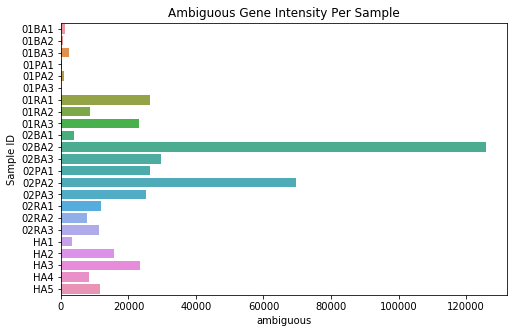

In [4]:
plt.figure(figsize=[8,5])
sns.barplot(y=raw_data.index, x=raw_data['ambiguous'])
plt.title("Ambiguous Gene Intensity Per Sample")
plt.show()

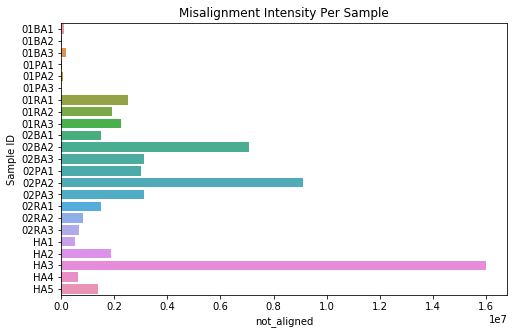

In [5]:
plt.figure(figsize=[8,5])
sns.barplot(y=raw_data.index, x=raw_data['not_aligned'])
plt.title("Misalignment Intensity Per Sample")
plt.show()

# Heatmap

In [6]:
#Drop first 6 groups, as they are bad
goodsamp_sel = np.array(count_data.sum(axis=1) > 100000) & ~count_data.index.isin(["02RA1", "02RA3"])
study_data = count_data[goodsamp_sel]
metadata = raw_metadata[goodsamp_sel]
study_data.to_csv("data/rcount_matrix.csv")
metadata.to_csv("data/rmetadata.csv", index_label=False)

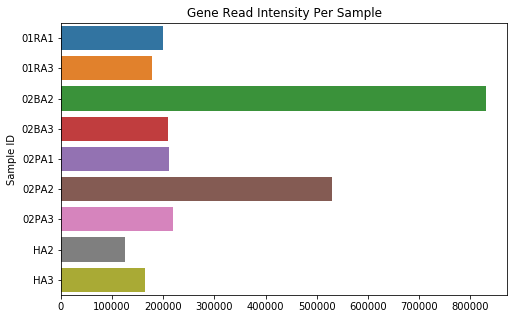

In [7]:
plt.figure(figsize=[8,5])
sns.barplot(y=study_data.index, x=study_data.sum(axis=1))
plt.title("Gene Read Intensity Per Sample")
plt.show()

In [8]:
norm_count_matrix = study_data.as_matrix() / study_data.sum(axis=1)[:, None]
norm_count_matrix = norm_count_matrix[:, norm_count_matrix.sum(axis=0) > 0]
norm_count_matrix = minmax_scale(norm_count_matrix)
print(study_data.shape, norm_count_matrix.shape)
heatmap = Data([
    Heatmap(
        x = study_data.columns, 
        y = study_data.index,
        z = norm_count_matrix,
        colorscale='Viridis'
    )
])
layout = Layout(
    title='Gene Expression Heatmap Normalized By Per Experiment Intensity',
    yaxis=dict(type="category"),
    margin=Margin(l=100)
)
fig = Figure(data=heatmap, layout=layout)
plotly.iplot(fig)

(9, 23420) (9, 13866)


# Principal Component Analysis and KMeans Clustering

In [9]:
def plotClusters(comp1, comp2, comp3, treatments, clusters, title=""):
    visrep = Scatter3d(
        x=comp1,
        y=comp2,
        z=comp3,
        text=treatments,
        mode='markers',
        marker=dict(
            size=12,
            color=clusters,
            colorscale='Viridis',
            opacity=0.8,
            line = dict(
                width = 0,
                color = "black"
            )
        )
    )
    fig = Figure(data=[visrep], layout=Layout(title=title))
    plotly.iplot(fig)

In [10]:
norm_count_matrix = study_data.as_matrix() / study_data.sum(axis=1)[:, None]
norm_count_matrix = norm_count_matrix[:, norm_count_matrix.sum(axis=0) > 0]
norm_count_matrix = minmax_scale(norm_count_matrix)
print(study_data.shape, norm_count_matrix.shape)
#PCA Decomposition to support later visualization
dim_red = PCA(n_components=11)
dim_red_genes = dim_red.fit_transform(norm_count_matrix)
print("% Variance Explained:", dim_red.explained_variance_ratio_.sum()*100)
plotClusters(dim_red_genes.T[0], dim_red_genes.T[1], dim_red_genes.T[2], 
             study_data.index, metadata["Experimental Group"].astype("category").cat.rename_categories([0,1,2,3]), 
             "Experimental Groups on 3 PCs")

(9, 23420) (9, 13866)
% Variance Explained: 100.0


In [11]:
#PCA Decomposition to support later visualization
dim_red = PCA(n_components=11)
dim_red_genes = dim_red.fit_transform(norm_count_matrix)
print("% Variance Explained:", dim_red.explained_variance_ratio_.sum()*100)
#K-Means Clustering
clf = KMeans(n_clusters=4)
clf.fit(dim_red_genes, metadata["Experimental Group"])
serieshat = clf.predict(dim_red_genes)
plotClusters(dim_red_genes.T[0], dim_red_genes.T[1], dim_red_genes.T[2], study_data.index, serieshat, 
             "Experimental Groups on 3 PCs Colored by KMeans Clustering (n=4)")

% Variance Explained: 100.0


# Hierarchical Clustering

In [12]:
def clusterer(data, classes, labels, affinity_method, linkage_method):
    #Create crosstab
    Hclustering = AgglomerativeClustering(n_clusters=5, affinity=affinity_method, linkage=linkage_method)
    Hclustering.fit(data)
    ms = np.column_stack((classes, Hclustering.labels_))
    df = pd.DataFrame(ms, columns = ["Ground truth","Clusters"])
    display(pd.crosstab(df["Ground truth"], df["Clusters"], margins=True))
    #Plot dendrogram
    z = linkage(data, metric=affinity_method, method=linkage_method)
    dendrogram(z, labels=labels, orientation="left")
    plt.show()

Clusters,0,1,2,3,4,All
Ground truth,,,,,,
BA,0,1,0,0,1,2
HA,0,0,1,1,0,2
PA,0,3,0,0,0,3
RA,2,0,0,0,0,2
All,2,4,1,1,1,9


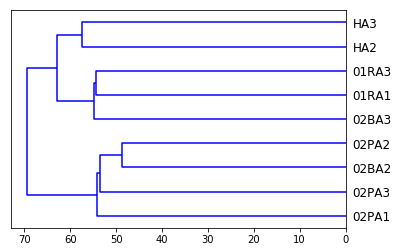

In [13]:
clusterer(norm_count_matrix, metadata["Experimental Group"], study_data.index, "euclidean", "ward")

Clusters,0,1,2,3,4,All
Ground truth,,,,,,
BA,1,0,0,0,1,2
HA,0,0,1,1,0,2
PA,0,2,0,0,1,3
RA,2,0,0,0,0,2
All,3,2,1,1,2,9


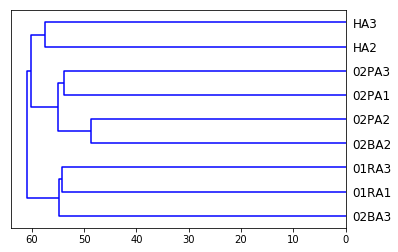

In [14]:
clusterer(norm_count_matrix, metadata["Experimental Group"], study_data.index, "euclidean", "complete")

# Pairwise Distance Mapping

In [15]:
from sklearn.metrics.pairwise import pairwise_distances
from numpy import seterr,isneginf,array

dist_matrix = pairwise_distances(norm_count_matrix, metric="euclidean")
dist_matrix[dist_matrix==0] = None

heatmap = Data([
    Heatmap(
        y = study_data.index, 
        x = study_data.index,
        z = dist_matrix,
        colorscale='Hot'
    )
])
layout = Layout(
    title='Pairwise Euclidean Distances',
    margin=Margin(l=100)
)
fig = Figure(data=heatmap, layout=layout)
plotly.iplot(fig)